### Imports

In [1]:
# file handling
import csv
import glob
from PIL import Image
import os
import requests
from PyPDF2 import PdfFileReader
from os import listdir
from os.path import isfile, join
import warnings


# text related tasks
from bs4 import BeautifulSoup
import regex as re

# dataframe related
import numpy as np
import pandas as pd 

# data visualization libraries
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
import matplotlib.ticker as mtick
import seaborn as sb
import squarify as sq

# setups
%matplotlib inline
sb.set()
warnings.filterwarnings("ignore")


# Exploratory Data Analysis (EDA)
___

## bcn data2015-2019 csv
> Lastly we decided to go for a 5 year period having in mind there's missing data for the rent prices in years 2012 and 2013, this way we can work with all data available , nevertheless we'll keep the other database (2009-20019) though :)

Let's start by checking our first homemade dataset:

In [2]:
df = pd.read_csv("C:\\Users\\motxi\\Documents\\Data_Science_IT_Academy\\PROJECTE\\data\\bcn_dataset2015_2019.csv")
display(df.info())
display(df.isna().sum())
display(df)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 365 entries, 0 to 364
Data columns (total 36 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Unnamed: 0                         365 non-null    int64  
 1   year                               365 non-null    int64  
 2   neighbourhood                      365 non-null    object 
 3   population                         365 non-null    float64
 4   % spaniards                        365 non-null    float64
 5   % strangers                        365 non-null    float64
 6   % w/ higher education              365 non-null    float64
 7   unemployed                         365 non-null    float64
 8   total_surface(m2)                  365 non-null    int64  
 9   housing(m2)                        365 non-null    int64  
 10  parking(m2)                        365 non-null    int64  
 11  commerce(m2)                       365 non-null    int64  

None

Unnamed: 0                             0
year                                   0
neighbourhood                          0
population                             0
% spaniards                            0
% strangers                            0
% w/ higher education                  0
unemployed                             0
total_surface(m2)                      0
housing(m2)                            0
parking(m2)                            0
commerce(m2)                           0
industry(m2)                           0
offices(m2)                            0
education(m2)                          0
healthcare(m2)                         0
hostelry(m2)                           0
sports(m2)                             0
religious(m2)                          0
entertainment(m2)                      0
other_uses(m2)                         0
avg_€/month                           14
avg_€/m2                              14
avg_housing(m2)                       14
new_contracts_10

,Unnamed: 0,year,neighbourhood,population,% spaniards,% strangers,% w/ higher education,unemployed,total_surface(m2),housing(m2),...,win_lost_rents_1000_hab,binary_rent_growth_1000_hab,gini_index(%),disp_income(€/year),new_household_purchases,protected_household_purchases,used_household_purchases,new_household_purchases(x1000€),Used_household_purchases(x1000€),Total_household_purchases(x1000€)
0,0,2015,Baró de Viver,2482.0,89.7,10.3,5.7,150.0,110971,80219,...,-20.708881,0.0,33.450000,11217.0,0.0,0.0,8.0,NaN,284.800000,284.800000
1,1,2015,Can Baró,8938.0,86.9,13.1,24.2,442.0,413313,318343,...,-16.278292,0.0,32.800000,18883.0,0.0,0.0,59.0,NaN,171.400000,171.400000
2,2,2015,Can Peguera,2267.0,92.9,7.1,7.0,141.0,69811,56595,...,-8.574007,0.0,34.450000,12002.0,0.0,0.0,5.0,NaN,NaN,NaN
3,3,2015,Canyelles,6946.0,95.9,4.1,10.4,554.0,309727,240025,...,-0.577617,0.0,26.140000,17003.0,0.0,0.0,31.0,NaN,135.600000,135.600000
4,4,2015,Ciutat Meridiana,10156.0,72.2,27.8,5.7,1146.0,271520,228636,...,0.497265,1.0,34.566667,10203.0,0.0,0.0,68.0,NaN,63.400000,63.400000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
360,360,2019,la Vila Olímpica del Poblenou,9385.0,80.6,19.4,54.1,391.0,1125546,421411,...,-1.000000,0.0,33.820000,32436.0,1.0,0.0,15.0,NaN,544.333333,544.333333
361,361,2019,la Vila de Gràcia,50926.0,76.4,23.6,47.5,1939.0,3422349,2228680,...,-8.900000,0.0,33.850000,23749.0,27.0,0.0,281.0,389.100,437.800000,435.750000
362,362,2019,les Corts,46731.0,86.2,13.8,45.0,1665.0,3889778,1961694,...,-0.800000,0.0,33.605714,28898.0,35.0,2.0,396.0,685.025,381.725000,395.025000
363,363,2019,les Roquetes,16417.0,75.3,24.7,9.8,906.0,569201,418422,...,-0.600000,0.0,30.040000,13014.0,0.0,0.0,185.0,NaN,173.575000,173.575000



## Dataset Variables

- **year**: Year the data was taken, the range is from 2015 to 2019
- **neighbourhood**: Each of the 73 neighbourhoods of Barcelona
- **housing(m2)**: Area devoted to housing as in registered activity
- **parking(m2)**: Area devoted to parking as in registered activity
- **comerce(m2)**: Area devoted to commerce as in registered activity
- **industry(m2)**: Area devoted to industry as in registered activity
- **offices(m2)**: Area devoted to offices as in registered activity
- **education(m2)**: Area devoted to education as in registered activity
- **healthcare(m2)**: Area devoted to healthcare as in registered activity
- **hostelry(m2)**: Area devoted to hostelry as in registered activity
- **sports(m2)**: Area devoted to sports as in registered activity
- **religious(m2)**: Area devoted to religious as in registered activity
- **shows(m2)**: Area devoted to shows as in registered activity
- **other_uses(m2)**: Area devoted to other uses as in registered activity
- **avg_€/month**: Average rent price per month
- **avg_€/m2** Average rent prices per squared meter
- **avg_housing(m2)**: Average Household size in squared meters
- **new_contracts_1000_hab**: Number of New rent contracts per thousand inhabitants
- **expired_contracts_1000_hab**: Number of Terminated rent contracts per thousand inhabitants
- **win_lost_rents_1000_hab**: Difference of new minus terminated rent contracts
- **binary_rent_growth_1000_hab**: Same as preceeding but in binary; 0 is negative rent growth whereas 1 represents positive rent growth
- **population**: Population censed in each neighbourhood
- **% spaniards**: Percentage of locals 
- **% strangers**: Percentage of strangers
- **% w/ higher education**: Percentage of people with higher studies
- **unemployed**: Number of unemployed people
- **gini_index(%)**: A measure of statistical dispersion intended to represent the income inequality or the wealth inequality within a nation or a social group. (0 means perfect equality and 100 perfect inequality)
- **disp_income(€/year)**: Households disposable income average per capita. Meaning the average amount of money left over that every person per household has, after paying taxes (a.k.a Net Income).
- **new_household_purchases**: Number of registered purchases of new (less than five years old) households	
- **protected_household_purchases**: Number of registered purchases of public housing households 	
- **used_household_purchases**: Number of registered purchases of used households 
- **new_household_purchases(x1000€)**: Average price (in thousands of €) of registered purchases of new (less than five years old) households 	
- **Used_household_purchases(x1000€)**: Average price (in thousands of €) of registered purchases of used households 
- **Total_household_purchases(x1000€)**: Average price (in thousands of €) of total registered household purchases 

This dataset was made with the intention of representing yearly series of all the Barcelona city's neighbourhoods specially including variables historically related to displacement and gentrification phenomena

It is conceptually divided in three categories:

- **Housing factors**: Here we include all terms relative to rent market as well as real state market. From average prices to amount of registered contracts, including average houshold sizes.


- **Population factors**: Were we include percentages of population by certain conditions like higher education and nationality.


- **Economic factors**: Here we include terms relative to wealth, like Gini index and disposable income. Also the number of unemployed people and city area percentage classified by registered activity.

In [3]:
# drop unnecesary column
df.drop('Unnamed: 0', axis=1, inplace=True)



## Rent market
___

- ###  Internal migration (slightly, here it's used more like a rate of rent-growth)

This is defined by substracting the terminated rent contracts per 1000 inhabitants from newly signed rent contracts per 1000 inhabitants. In essence it's a way of looking at the rate of rent growth, hence:
- positive rate indicates the rent market is growing in that zone, whether it be due to newcomers into the market or other conjuctional causes in relation with the prices.

- negative rate indicates the rent market is decreasing in that zone, whether it be due to reduction of the rent-park (e.g. demolition due to private or public construction plans) or other conjuctional causes in relation with the prices.

This here must be taken with a grain of salt since, this feature per se might not be as informative as It could be when mixed with rent-market prices, disposable income and geolocalization. 

Rent-market prices and disposable income are critical to make hipotesis, since a zone with negative rent-growth-rate and growing prices could indicate that some of the renters are being pushed as Cohen & Pettit(2019) describe in better words:
>**"** ...Many analyses of neighborhood change include tracking rent prices in the focus area. Rises in rental prices are early indicators that there is increasing demand from households with higher incomes. Because renters tend to be less financially stable than homeowners and are subject to landlord decisionmaking, renters with low-income are particularly vulnerable to displacement from gentrification... **"**[3]

Geolocalization combined with domain expertise (local knowledge of the city in this case) could deliver plenty more insights having the graphical representation (map) so it'd be easier to spot spreading trends amongst the closest neighbourhoods no matter the district they're in. 

In the case of this study we can do the first two as we happen to have the data. Regarding the third, wich we didn't include, it could be really interesting for future improvements of the dataset. 

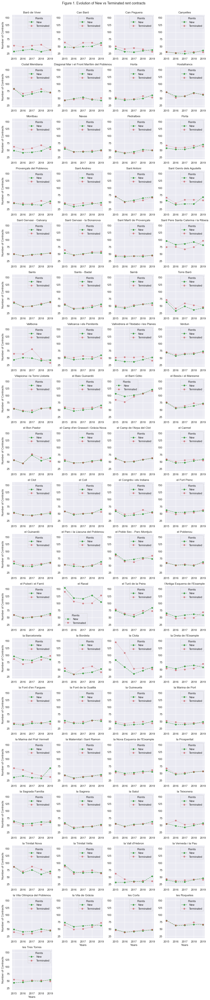

In [4]:
# Create a grid : initialize it
g = sb.FacetGrid(df, col='neighbourhood', hue='neighbourhood', col_wrap=4)

# Add the line over the area with the plot function
g = g.map(plt.plot, 'year', 'new_contracts_1000_hab',color='green', linestyle='dashed', marker='o', alpha=0.6)
g = g.map(plt.plot, 'year', 'expired_contracts_1000_hab',color='r', linestyle= 'dotted', marker='o', alpha=0.6)

# show legend and xticks in every subplot 
for ax in g.axes.ravel():
    ax.legend(title='Rents', labels=['New', 'Terminated'])
    
for ax in g.axes.flat:
    ax.tick_params(labelleft=True, labelbottom=True)
    plt.xticks(np.arange(2015,2020,1))
        
g = g.set_titles("{col_name}")
g = g.set_axis_labels('Years','Number of Contracts')

# Add a title for the whole plot
plt.suptitle('Figure 1. Evolution of New vs Terminated rent contracts', y=1 ,fontsize=14)

# Show the graph
sb.set()
plt.tight_layout()
plt.show()
plt.close('all')

As seen, we could agree there's a condition of stability, meaning the majority of the neighbourhoods present a steady relationship of "semi-equilibrium" between the two variables. In quite of them both lines are overlapped at some or most points, showing equilibrium in terms of rent market.    

Interestingly, the vast majority of neighbourhoods have their lines crossing in 2018-2019 one way or the other.

Then, there's another type of cases, where more differences can be spotted. At first glance it seems that:
- Neighbourhoods in the Downtown (ciutat Vella) or other 'centric' zones well comunicated show more activity, bigger pattern differences and more pronounced trends as well.


- The outskirts tend to present a negative rate in their majority especially those neighbourhoods close to the "working-class" side of the hills.



- ### Average rented squared meter price (€/m<sup>2</sup>)

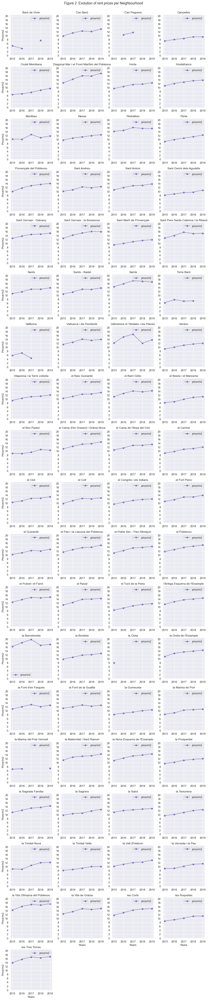

In [56]:
# Create a grid : initialize it
g = sb.FacetGrid(df, col='neighbourhood', hue='neighbourhood', col_wrap=4)

# Add the line over the area with the plot function
g = g.map(plt.plot, 'year', 'avg_€/m2', color='m', linestyle='solid', marker='o')

# show legend and xticks in every subplot 
for ax in g.axes.ravel():
    ax.legend(labels=['price/m2'])
    
for ax in g.axes.flat:
    ax.tick_params(labelleft=True,labelbottom=True)
    plt.xticks(np.arange(2015,2020,1))
    plt.yticks(np.arange(0,22,2))
    
g = g.set_titles("{col_name}")
g = g.set_axis_labels('Years','Price/m2')

# Add a title for the whole plot
plt.subplots_adjust(top=0.97)
g = g.fig.suptitle('Figure 2. Evolution of rent prices per Neighbourhood',y=1, fontsize=14)

# Show the graph
sb.set()
plt.tight_layout()
plt.show()
plt.close('all')

Some hoods are not complete, yet there's a generalized growth tendency, especially going from 10€ to 15€, so we can identify three main groups: 
- Group A: neighbourhoods with prices lower than 10€/m<sup>2</sup>
- Group B: neighbourhoods with prices bigger than 10€/m<sup>2</sup> & lower than 15€/m<sup>2</sup>
- Group C: neighbourhoods with prices beyond 15€/m<sup>2</sup>

Beyond this, we could bennefit from checking the average area of the rented households since higher-class neighbourhoods tend to present bigger flats. 

So in this case, we would expect that the biggest flats would come from actual and past wealthier zones, closer to the hills of Collserola (where the blooming high-bourgeoisie from the city had their country mansions constructed) and from l'Eixample as well (since it was designed to provide better flats at the outskirts for the "not-so-rich" burgeouise, away from old-town's insalubrity and their hacinated alleys dating from the middle-Ages).

Mostly we should see flat tendencies, deviations could be further related to the area destined to housing in the neighbourhood  or changes in population numbers.

- ### Average Household size (**m<sup>2</sup>**)

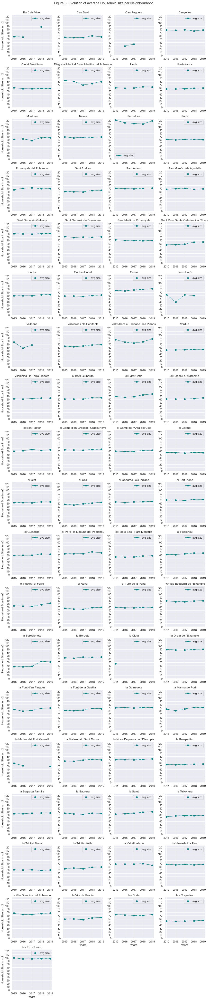

In [6]:
# Create a grid : initialize it
g = sb.FacetGrid(df, col='neighbourhood', hue='neighbourhood', col_wrap=4)

# Add the line over the area with the plot function
g = g.map(plt.plot, 'year', 'avg_housing(m2)',color='teal', linestyle='dashdot', marker='o')

# show legend and xticks in every subplot 
for ax in g.axes.ravel():
    ax.legend(labels=['avg size'])
    
for ax in g.axes.flat:
    ax.tick_params(labelleft=True,labelbottom=True)
    plt.xticks(np.arange(2015,2020,1))
    plt.yticks(np.arange(0,130,10))
    
g = g.set_titles("{col_name}")
g = g.set_axis_labels('Years','Household Size in m2')

# Add a title for the whole plot
plt.suptitle('Figure 3. Evolution of average Household size per Neighbourhood',y=1, fontsize=14)

# Show the graph
sb.set()
plt.tight_layout()
plt.show()
plt.close('all')

So pretty much no surprises for a barcelonian, 3 categories:
- Group A: neighbourhoods with avg household area smaller than 60m<sup>2</sup>
- Group B: neighbourhoods with avg household area bigger than 60m<sup>2</sup> & smaller than 80m<sup>2</sup>
- Group C: neighbourhoods with avg household area bigger than 80m<sup>2</sup>

As stated, l'Eixample Dreta (the bourgeouse one) and other wealthier zones like Pedralbes present bigger flats, this latter being one of the most prominent examples since it was mostly constructed in the uptown during the 60's (therefore the flats were bigger).

In contrast we could argue that some zones have historically suffered from the fact of being squashed inner-walls (until 1854 when the walls where teared-down due to progressive city growth, wich in turn meant the annexation of all the neighboring counties in 1897). 

So in reality we could end-up with a neighbourhood like La Barceloneta, with some of the smallest flats and the biggest prices per squared meter given his proximity to the beaches, because tourism, you know...

But let's check the average monthly price in euros. Mostly what i expect to be seen is an upward trend in the majority of neighbourhoods mimicking the one we saw in prices/m2.

- ###  Average rent price **(€/month)**

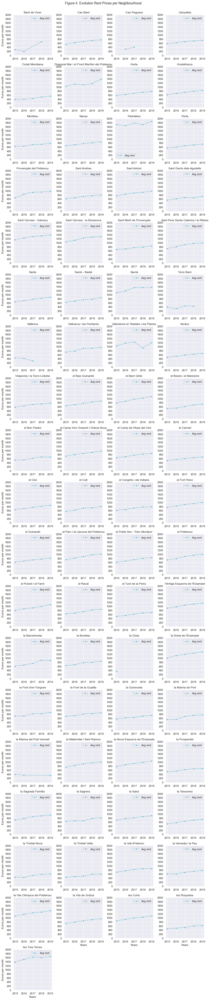

In [7]:
# Create a grid : initialize it
g = sb.FacetGrid(df, col='neighbourhood', hue='neighbourhood', col_wrap=4)

# Add the line over the area with the plot function
g = g.map(sb.lineplot, 'year', 'avg_€/month',color='c', linestyle='dashed', marker='o')

# show legend and xticks in every subplot 
for ax in g.axes.ravel():
    ax.legend(labels=['Avg rent'])
    
for ax in g.axes.flat:
    ax.tick_params(labelleft=True,labelbottom=True)
    plt.xticks(np.arange(2015,2020,1))
    plt.yticks(np.arange(0,2100,200))
g = g.set_titles("{col_name}",fontsize=14)
g = g.set_axis_labels('Years','Euros per month')

# Add a title for the whole plot
plt.suptitle('Figure 4. Evolution Rent Prices per Neighbourhood',y=1, fontsize=14)

# Show the graph
sb.set()
plt.tight_layout()
plt.show()
plt.close('all')

We could state three main groups based on rent prices:
- Group A: Less than 800€/month
- Group B: Between 800 - 1100€/month
- Group C: More than 1100€/month

## Real Estate market
___

>**"** ...An increase in the number and price of home sales can indicate an accelerating housing market. This can increase pressure on homeowners with low-incomes and reduce the amount of housing available for renters... **"** <sup>[12]</sup>

In this case , data was presented in a way that based on household condition we can separate from new, used and public households. 

Officially New houses are considered to be less than 5 years old

Thus we can acknowledge the amount of real-state purchases, and the average anual price. (\* Data registered from 100% owner changing, and only neighbourhoods with more than 2 purchases within the provided time frames where taken into account)

- ### Amount of Registered Household Purchases by type **(new Vs used Vs public)** 

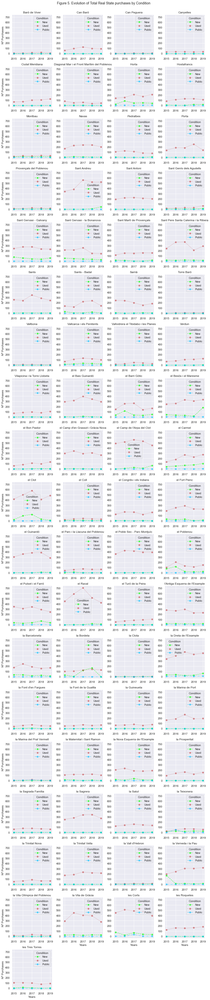

In [8]:
# Create a grid : initialize it
g = sb.FacetGrid(df, col='neighbourhood', hue='neighbourhood', col_wrap=4)

# Add the line over the area with the plot function
g = g.map(plt.plot, 'year', 'new_household_purchases',color='lime', linestyle='dashed', marker='o', alpha=0.6)
g = g.map(plt.plot, 'year', 'used_household_purchases',color='r', linestyle= 'dotted', marker='o', alpha=0.6)
g = g.map(plt.plot, 'year', 'protected_household_purchases', linestyle='dashdot', color='deepskyblue', marker='o', alpha=0.6)

# show legend and xticks in every subplot 
for ax in g.axes.ravel():
    ax.legend(title='Condition', labels=['New', 'Used', 'Public'])
    
for ax in g.axes.flat:
    ax.tick_params(labelleft=True, labelbottom=True)
    plt.xticks(np.arange(2015,2020,1))
    plt.yticks(np.arange(0,800,100))
    
g = g.set_titles("{col_name}")
g = g.set_axis_labels('Years','Nº Purchases')

# Add a title for the whole plot
plt.suptitle('Figure 5. Evolution of Total Real State purchases by Condition', y=1 ,fontsize=14)

# Show the graph
sb.set()
plt.tight_layout()
plt.show()
plt.close('all')

- ### Average Price (in thousands Euros) of Registered Household Purchases by Type **(new Vs used Vs public)**  

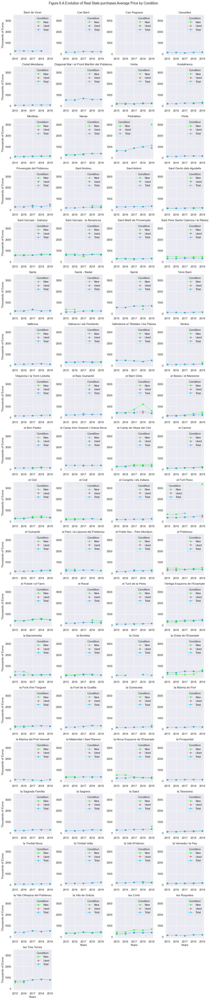

In [9]:
# Create a grid : initialize it
g = sb.FacetGrid(df, col='neighbourhood', hue='neighbourhood', col_wrap=4)

# Add the line over the area with the plot function
g = g.map(plt.plot, 'year', 'new_household_purchases(x1000€)',color='lime', linestyle='dashed', marker='o', alpha=0.6)
g = g.map(plt.plot, 'year', 'Used_household_purchases(x1000€)',color='r', linestyle= 'dotted', marker='o', alpha=0.6)
g = g.map(plt.plot, 'year', 'Total_household_purchases(x1000€)', linestyle='dashdot', color='deepskyblue', marker='o', alpha=0.6)

# show legend and xticks in every subplot 
for ax in g.axes.ravel():
    ax.legend(title='Condition', labels=['New', 'Used', 'Total'])
    
for ax in g.axes.flat:
    ax.tick_params(labelleft=True, labelbottom=True)
    plt.xticks(np.arange(2015,2020,1))
    #plt.yticks(np.arange(0,4000,500))
    
g = g.set_titles("{col_name}")
g = g.set_axis_labels('Years','Thousands of Euros')

# Add a title for the whole plot
plt.suptitle('Figure 6.A Evolution of Real State purchases Average Price by Condition', y=1 ,fontsize=14)

# Show the graph
sb.set()
plt.tight_layout()
plt.show()
plt.close('all')

Since there's only two samples with avg price beyond 3 milions and there's not much info available from new homes we'll do without them to see results with better scaled definition.

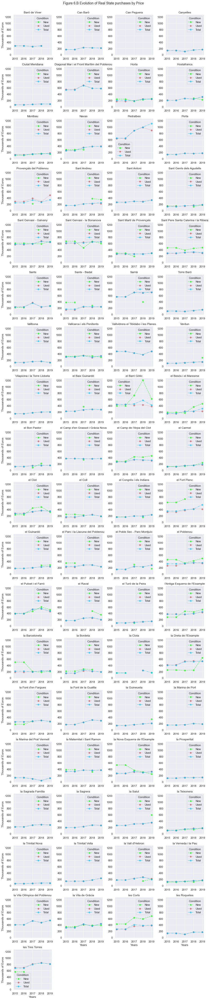

In [10]:
# impute nan to outliers and plot again
df['new_household_purchases(x1000€)'].loc[df['new_household_purchases(x1000€)'] > 2000] = np.nan

# Create a grid : initialize it
g = sb.FacetGrid(df, col='neighbourhood', hue='neighbourhood', col_wrap=4)

# Add the line over the area with the plot function
g = g.map(plt.plot, 'year', 'new_household_purchases(x1000€)',color='lime', linestyle='dashed', marker='o', alpha=0.6)
g = g.map(plt.plot, 'year', 'Used_household_purchases(x1000€)',color='r', linestyle= 'dotted', marker='o', alpha=0.6)
g = g.map(plt.plot, 'year', 'Total_household_purchases(x1000€)', linestyle='dashdot', color='deepskyblue', marker='o', alpha=0.6)

# show legend and xticks in every subplot 
for ax in g.axes.ravel():
    ax.legend(title='Condition', labels=['New', 'Used', 'Total'])
    
for ax in g.axes.flat:
    ax.tick_params(labelleft=True, labelbottom=True)
    plt.xticks(np.arange(2015,2020,1))
    #plt.yticks(np.arange(0,1200,100))
    
g = g.set_titles("{col_name}")
g = g.set_axis_labels('Years','Thousands of Euros')

# Add a title for the whole plot
plt.suptitle('Figure 6.B Evolution of Real State purchases by Price', y=1 ,fontsize=14)

# Show the graph
sb.set()
plt.tight_layout()
plt.show()
plt.close('all')

Interestingly we can observe moments in wich the price of new households was minor than the used, from wich we could hypotetically reason that these brand new constructed households are smaller than the used ones having in mind the usual difference in price per m<sup>2</sup> between new and used.


## Population  factors
___


- ###  Population censed per neighbourhood

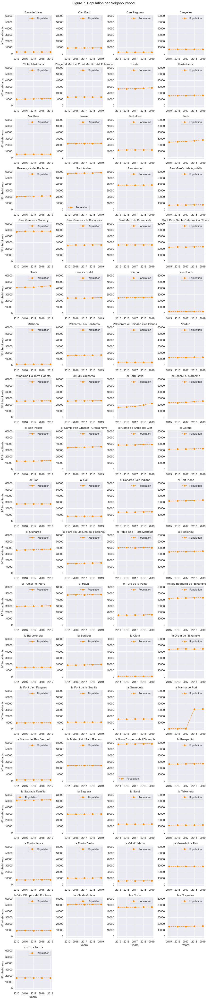

In [11]:
# Create a grid : initialize it
g = sb.FacetGrid(df, col='neighbourhood', hue='neighbourhood', col_wrap=4)

# Add the line over the area with the plot function
g = g.map(plt.plot, 'year', 'population', color='darkorange', linestyle='dashed', marker='o')

# show legend and xticks in every subplot 
for ax in g.axes.ravel():
    ax.legend(labels=['Population'])
    
for ax in g.axes.flat:
    ax.tick_params(labelleft=True, labelbottom=True)
    plt.xticks(np.arange(2015,2020,1))
    #plt.yticks(np.arange(0,1200,100))
    
g = g.set_titles("{col_name}")
g = g.set_axis_labels('Years','Nº Inhabitants')

# Add a title for the whole plot
plt.suptitle('Figure 7. Population per Neighbourhood', y=1)

# Show the graph
sb.set()
plt.tight_layout()
plt.show()
plt.close('all')

Quite steady since the areas with the bigger population might be blurring the scale making it difficult for the eye to spot trends on smaller scales. 

- ### Unemployed vs Foreigners vs People with Higher Studies

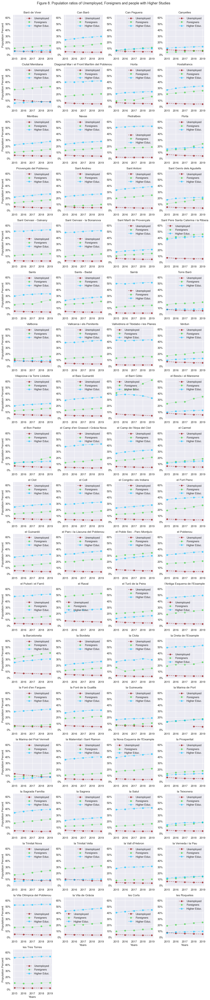

In [12]:
# create column in percentage to compare better
df['%_unemployed'] = (df['unemployed'] / df['population']).mul(100)

# Create a grid : initialize it
g = sb.FacetGrid(df, col='neighbourhood', hue='neighbourhood', col_wrap=4)

# Add the line over the area with the plot function
g = g.map(plt.plot, 'year', '%_unemployed', color='darkred', linestyle='dashed', marker='o', alpha=0.6)
g = g.map(plt.plot, 'year', '% strangers', color='limegreen', linestyle='dotted', marker='o', alpha=0.6)
g = g.map(plt.plot, 'year', '% w/ higher education', color='deepskyblue', linestyle='dashdot', marker='o', alpha=0.6)

# show legend and xticks in every subplot 
for ax in g.axes.ravel():
    ax.legend(labels=['Unemployed', 'Foreigners', 'Higher Educ.' ], framealpha=0.3)
    
for ax in g.axes.flat:
    ax.tick_params(labelleft=True, labelbottom=True)
    plt.xticks(np.arange(2015,2020,1))
    ax.yaxis.set_major_formatter(mtick.PercentFormatter())
    #plt.yticks(np.arange(0,1200,100))
    
g = g.set_titles("{col_name}")
g = g.set_axis_labels('Years','Population Percent')

# Add a title for the whole plot
plt.suptitle('Figure 8. Population ratios of Unemployed, Foreigners and people with Higher Studies', y=1)

# Show the graph
sb.set()
plt.tight_layout()
plt.show()
plt.close('all')

Based on latter figure, we can tell that:

- Unemployment rate has a global downtrend. The lowest values are mostly seen in the wealthiest areas.


- There seems to be a positive correlation between the percentage of foreigners and the percentage of people with higher studies, in a way that in most graphics both lines are tilted to aproximately the same degree. Exceptions to this point are found in notorious touristic places (e.g "el Barri Gòtic") or places at another scale, meaning with a population small enough to fool the percentages with tiny data changes (e.g "la Clota").


## Economic factors
___


- ### Average Disposable Income vs Gini Index

Meaning the average amount of money left over that every person per household has after paying taxes (€/Year) vs Wealth Inequality(0-100)

Since these two factors don't share the same scales, we could improve the visualization with a Normalizing process. This consisting on re-escaling the numbers in-between 0-1 following the next formula: 
$$x.normalized = \frac{(x- x.minimum)}{x.range}$$


First we'll look up the maximums and minimums to get the range, but since we're in a timeseries first we'll have to group by year to apply the above formula with coherence. After that we'll enlarge series to match data so we can concatenate them as new columns. (\*tried to apply formula directly on series and it worked swell but after a rerun of the whole notebook, it didn't work anymore so I had to revert to checkpoint and loose the time spent trying to debug it plus the amount of work done before checkpoint. I guess we'll walk the sure way...

In [13]:
# series won't work, idiopathically, so here we are with lists... 
maxis = list(df.groupby(['year'])['disp_income(€/year)'].max())
minis = list(df.groupby(['year'])['disp_income(€/year)'].min())

# create and fill new columns based on df.year values
conditions = [
    (df['year'] == 2015),
    (df['year'] == 2016),
    (df['year'] == 2017),
    (df['year'] == 2018),
    (df['year'] == 2019)    
]

values_min = [ minis[0], minis[1], minis[2], minis[3], minis[4] ]
values_max = [ maxis[0], maxis[1], maxis[2], maxis[3], maxis[4] ]

df['min'] = np.select(conditions,values_min)
df['max'] = np.select(conditions,values_max)
df['le_rangê'] = df['max'] - df['min']

Now hands on to the formula. Once normalized multiplying it by 100 would made the work since then both variables would be expressed in the same scale:
- Diposable Income with 0 meaning the lowest income levels and 100 meaning the whealthiest of all data.
- Gini Index with 0 meaning perfect equality and 100 meaning perfect inequality

In [14]:
df['disp_income_norm'] = ((df['disp_income(€/year)'] - df['min']) / (df['le_rangê'])).mul(100)

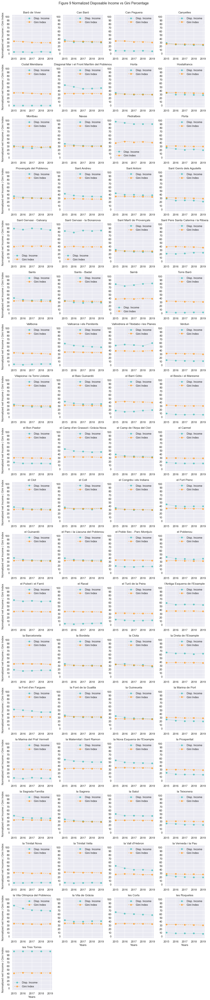

In [15]:
# Create a grid : initialize it
g = sb.FacetGrid(df, col='neighbourhood', hue='neighbourhood', col_wrap=4)

# Add the line over the area with the plot function
g = g.map(plt.plot, 'year', 'disp_income_norm',color='lightseagreen', linestyle='dotted', marker='o', alpha=0.6)
g = g.map(plt.plot, 'year', 'gini_index(%)',color='darkorange', linestyle='dashed', marker='o', alpha=0.6)

# show legend and xticks in every subplot 
for ax in g.axes.ravel():
    ax.legend(labels=['Disp. Income', 'Gini Index'], framealpha=0.3)
    
for ax in g.axes.flat:
    ax.tick_params(labelleft=True,labelbottom=True)
    plt.xticks(np.arange(2015,2020,1))
    plt.yticks(np.arange(0,110,10))
    
g = g.set_titles("{col_name}")
g = g.set_axis_labels('Years','Normalized net Income | Gini Index')

# Add a title for the whole plot
plt.suptitle('Figure 9 Normalized Disposable Income vs Gini Percentage',y=1, fontsize=14)

# Show the graph
sb.set()
plt.tight_layout()
plt.show()
plt.close('all')

Gini index stays mostly around the 30-40 range and a slightly diminishing trend is the rule over all the data.

Disposable Income shows; small generalized movement downwards (most acute in 2015-16 periods), variety of patterns and stability.

When analizing the relationship of the two indicators, patterns appear regarding the separation and relative position of both:
- Separation: Ideally in a perfect society, that is with disposable income on top, we want to see this separation maximized getting highest incomes with the lowest inequality. But in reality we could try to interpret the gini index line as a treshold, due to its stability and the wide variety of incomes present in the data.


- Relative Position: Normalized Disposable income lower than the gini index is seen in most of the neighbourhoods popularly percieved as "under-average". . On the other hand, wealthier areas present Disposable income above Gini Index. In between these two, another category arises since there's many average-class neighbourhoods where lines almost overlap.

- ### Household Disposable Income vs Most common Disposable income

This is the average income for citizens from a particular neighbourhood vs the most repeated average income in the city.

Problem here it's a bit trickier since economic data is like spoken sentences, the longer it is, the more unique it gets.

This makes it dificult for us if we want to find the mode, because most probably all numbers will appear once and (if we're lucky) we'll get the only number with two coincidences in 73 lines...and perhaps other numbers will be closer amongst themselves but since none of them are exactly equal this would lead us to introduce misleading data in our model.

Lets check the unique data in designated column for a random year to better illustrate this phenomenon

In [16]:
# create counts for all years and check the first in place
df_aux = df.groupby(['year'])['disp_income(€/year)'].agg(lambda x:x.value_counts().index[0])

print(df_aux)

year
2015    18285.0
2016    11602.0
2017    14811.0
2018    15032.0
2019    12022.0
Name: disp_income(€/year), dtype: float64


¿Should we blindly trust this results?

In [17]:
# select all neigbourhoods for one year
lst_aux = df['disp_income(€/year)'].loc[df['year']==2015 ]

# create a dict counting them
d = lst_aux.value_counts().to_dict()
print(d)

{18285.0: 2, 11217.0: 1, 13602.0: 1, 22559.0: 1, 25759.0: 1, 18079.0: 1, 18514.0: 1, 14714.0: 1, 24252.0: 1, 10896.0: 1, 16119.0: 1, 26114.0: 1, 20371.0: 1, 14664.0: 1, 19663.0: 1, 19816.0: 1, 20817.0: 1, 18850.0: 1, 11935.0: 1, 18934.0: 1, 11305.0: 1, 12593.0: 1, 25740.0: 1, 20602.0: 1, 30058.0: 1, 16022.0: 1, 22082.0: 1, 11206.0: 1, 23709.0: 1, 16003.0: 1, 22090.0: 1, 18638.0: 1, 21089.0: 1, 15152.0: 1, 23180.0: 1, 18536.0: 1, 19157.0: 1, 18883.0: 1, 33169.0: 1, 31298.0: 1, 17061.0: 1, 20496.0: 1, 20177.0: 1, 18642.0: 1, 16518.0: 1, 19020.0: 1, 17613.0: 1, 17628.0: 1, 18397.0: 1, 23274.0: 1, 10203.0: 1, 17003.0: 1, 12002.0: 1, 29681.0: 1, 15154.0: 1, 14395.0: 1, 18294.0: 1, 19561.0: 1, 23093.0: 1, 14361.0: 1, 12474.0: 1, 14456.0: 1, 20216.0: 1, 13519.0: 1, 19987.0: 1, 22840.0: 1, 24090.0: 1, 10768.0: 1, 10912.0: 1, 28847.0: 1, 18297.0: 1, 33899.0: 1}


Real List from 2015 presents a high distribution of values, yet 18285 was chosen as representative sample of the most repeated value from all this unique numbers above...

To solve this, the used solution is to divide by 1000 getting the tens of thousands in decimals, then round it up to the nearest integer, append it to a list and store this list in a dictionary so we can easily tag each list.

In [18]:
# create dictionary containing all rounded incomes per year   
obj = {}
for x in range(2015,2020,1):
    lst = df['disp_income(€/year)'].loc[df['year']==x] 
    d = lst.value_counts().to_dict()
    obj['rounded_incomes ' + str(x)] = []
    for k in d.keys():
        k = round(k/1000)
        obj['rounded_incomes ' + str(x)].append(k)
        


Convert the lists in the dictionary in a series, create a dictionary counts for the rounded data and find the max value (it's key will be the most common income in thousands of euros)

In [19]:
# create final list
lst_modes = []
for x in obj.values():
    series_aux = pd.Series(x)    
    d = series_aux.value_counts().to_dict() 
    max_val = list(d.values())
    max_key = list(d.keys()) 
    x = max_key[max_val.index(max(max_val))]
    x = x * 1000
    lst_modes.append(x)

print('Modes for every year are:', lst_modes)             

Modes for every year are: [19000, 19000, 19000, 19000, 20000]


Once we have the list we need to create the new column with the values obtained per every year

In [20]:
# create and fill new columns based on df.year values
conditions = [
    (df['year'] == 2015),
    (df['year'] == 2016),
    (df['year'] == 2017),
    (df['year'] == 2018),
    (df['year'] == 2019)    
]

values = [ lst_modes[0], lst_modes[1], lst_modes[2], lst_modes[3], lst_modes[4] ]

df['disp_income_mode'] = np.select(conditions,values)


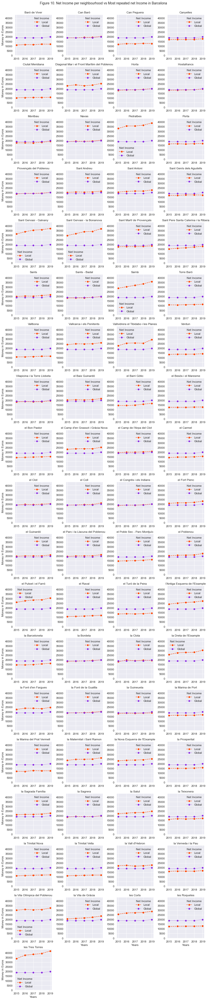

In [21]:
# Create a grid : initialize it
g = sb.FacetGrid(df, col='neighbourhood', hue='neighbourhood', col_wrap=4)

# Add the line over the area with the plot function
g = g.map(plt.plot, 'year', 'disp_income(€/year)',color='orangered', linestyle='dashed', marker='o')
g = g.map(plt.plot, 'year', 'disp_income_mode',color='blueviolet', linestyle='dotted', marker='o')

# show legend and xticks in every subplot 
for ax in g.axes.ravel():
    ax.legend(title='Net Income',labels=['Local', "Global"], framealpha=0.3)
    
for ax in g.axes.flat:
    ax.tick_params(labelleft=True,labelbottom=True)
    plt.xticks(np.arange(2015,2020,1))
    plt.yticks(np.arange(0,44000,5000))
    
g = g.set_titles("{col_name}")
g = g.set_axis_labels('Years','Money in Euros')

# Add a title for the whole plot
plt.suptitle('Figure 10. Net Income per neighbourhood vs Most repeated net Income in Barcelona',y=1, fontsize=14)

# Show the graph
sb.set()
plt.tight_layout()
plt.show()
plt.close('all')

- ### Area Distribution per Registered Activity  

Here there are many uses per surface in a city, ranging from housing (wich presumably has the biggest portion devoted) to shows and other categories that might present residual percentages.

A solution here is to group the categories according to their significance in the subject for this study. Housing, commerces, industries, offices and hostelry and another uses are independent in their own. 

Then there's communitary related categories grouping education, healthcare, sports, religious and shows. Let's call it family-group

In [22]:
df['communitary_group(m2)'] = df['education(m2)'] + df['healthcare(m2)'] + df['religious(m2)'] + df['entertainment(m2)'] + df['parking(m2)'] 

Once grouped we need to add a very small number to each element of size column

In [23]:
df['communitary_group'] = df['communitary_group(m2)'].apply(lambda x: x + 0.000001)
df['housing'] = df['housing(m2)'].apply(lambda x: x + 0.000001)
df['industry'] = df['industry(m2)'].apply(lambda x: x + 0.000001)
df['commerce'] = df['commerce(m2)'].apply(lambda x: x + 0.000001)
df['offices'] = df['offices(m2)'].apply(lambda x: x + 0.000001)
df['hotel/rest'] = df['hostelry(m2)'].apply(lambda x: x + 0.000001)
df['sports'] = df['sports(m2)'].apply(lambda x: x + 0.000001)
df['other_uses'] = df['other_uses(m2)'].apply(lambda x: x + 0.000001)


In [24]:
# loop trough years and make a grid for each one
year = 2015
while year < 2020:
    
    # set figure
    fig, axes = plt.subplots(11, 7, figsize=(80, 80))
    plt.subplots_adjust(top=0.95, bottom=0.05, left=0.05, right=0.95)
    # set counters for subplots
    i = 0
    j = 0
    
    for hood_name in list(df['neighbourhood'].unique()):

        axes[i, j].set_title(hood_name + ' ' + str(year))

        # select slices to use as data
        aux = df.loc[(df['year']==year)&(df['neighbourhood']==hood_name),
                        ['housing','commerce','industry','offices','hotel/rest',
                         'communitary_group', 'sports','other_uses']].values.flatten().tolist()
        # write labels
        labels = ['housing','retail','industry','offices','hotel/rest','communitary_group', 'sports', 'others']
        mpl.rcParams['font.size'] = 12    
        
        # plot treemap
        sq.plot(sizes=aux,
                label=labels,
                color=['silver', 'gold', 'burlywood', 'orangered', 'lime', 'blueviolet','olivedrab', 'dodgerblue'],
                alpha=0.9,
                ax=axes[i,j])
        
        # remove axis for a cleaner plot
        axes[i, j].axis('off')

        # update counters
        j += 1
        if j > 6:
            j = 0
            i += 1   
    
    # show/save plot
    plt.subplots_adjust(wspace=0.09, hspace=0.12)
    plt.suptitle(str(year), fontsize=40, y=0.965)
    plt.savefig(r'C:\\Users\\motxi\\Documents\\Data_Science_IT_Academy\\PROJECTE\\images\\surface_uses\\surfaces' + str(year) + '.png')
    
    plt.close()

    # update year
    year += 1 

In [25]:
# create animation

    # filepaths
fp_in = r'C:\\Users\\motxi\\Documents\\Data_Science_IT_Academy\\PROJECTE\\images\\surface_uses/*.png'
fp_out = r'C:\\Users\\motxi\\Documents\\Data_Science_IT_Academy\\PROJECTE\\images\\surface_uses.gif'

imgs = (Image.open(f) for f in sorted(glob.glob(fp_in)))
img = next(imgs)
img.save(fp=fp_out, format='GIF', append_images=imgs,save_all=True, duration=2000, loop=0)

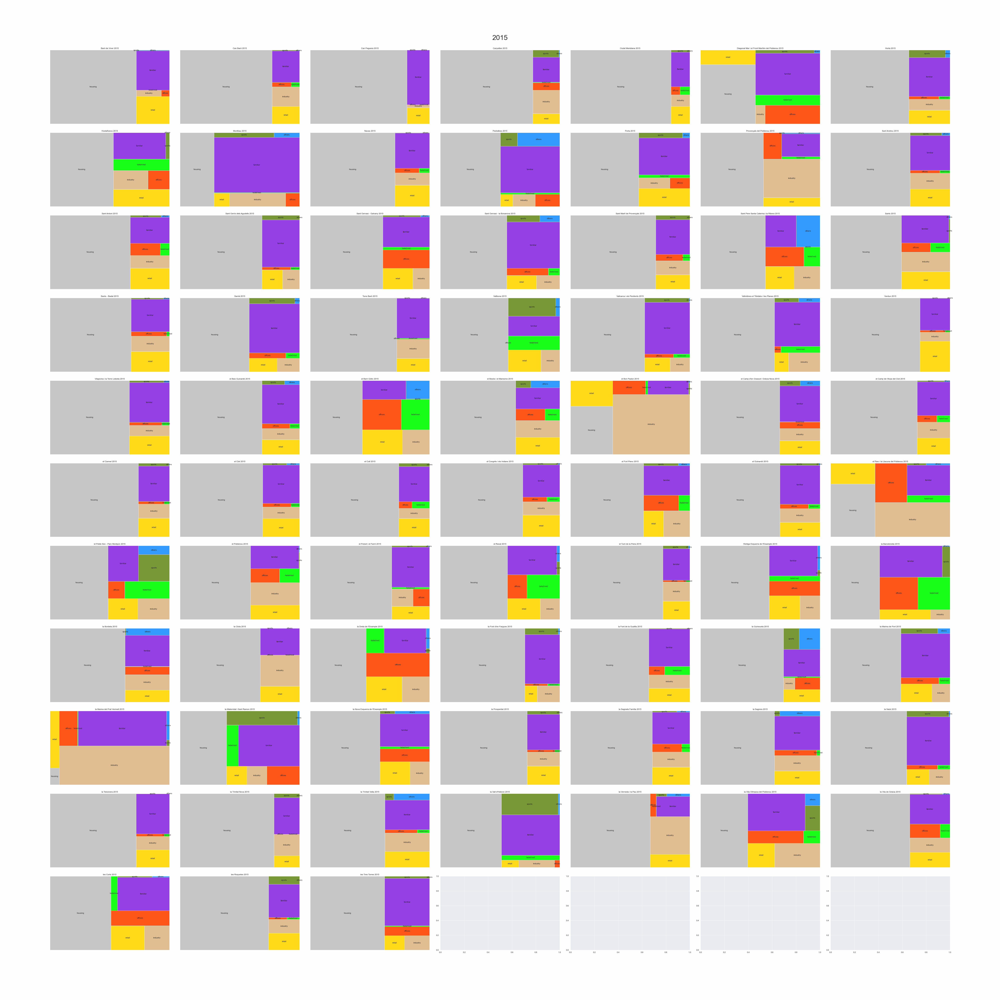


Too big too obtain the details, let's reuse the code to a function so we can check a few selected neighbourhoods

In [52]:
# create method
def treemap_lite(lst, str_name): 
    
    # copy loop trough years and make a grid for each one
    year = 2015
    while year < 2020:

        # set figure
        fig, axes = plt.subplots(2, 2, figsize=(12, 9))
        plt.subplots_adjust(top=0.95, bottom=0.05, left=0.05, right=0.95)
        # set counters for subplots
        i = 0
        j = 0

        for hood_name in lst:
            # counters logic
            if j > 1:
                j = 0
                i += 1
                
            axes[i, j].set_title(hood_name + ' ' + str(year), fontsize=18)

            # select slices to use as data
            aux = df.loc[(df['year']==year)&(df['neighbourhood']==hood_name),
                            ['housing','commerce','industry','offices','hotel/rest',
                             'communitary_group', 'sports','other_uses']].values.flatten().tolist()
            # write labels
            labels = ['housing','retail','industry','offices','hotel/rest','communitary_group', 'sports', 'others']
            mpl.rcParams['font.size'] = 12    

            # plot treemap
            sq.plot(sizes=aux,
                    label=labels,
                    color=['silver', 'gold', 'burlywood', 'orangered', 'lime', 'blueviolet','olivedrab', 'dodgerblue'],
                    alpha=0.9,
                    ax=axes[i,j])

            # remove axis for a cleaner plot
            axes[i, j].axis('off')

            # update counters
            j += 1
            
            
                

        # show/save plot
        plt.subplots_adjust(wspace=0.09, hspace=0.12)
        path_imgs = 'C:\\Users\\motxi\\Documents\\Data_Science_IT_Academy\\PROJECTE\\images\\animations\\'+ str_name +'\\'+ str_name + str(year) + '.png'
        plt.savefig(path_imgs, bbox_inches='tight')

        plt.close()

        # update year
        year += 1 
        
        # create animation

    # filepaths
    fp_in = r'C:\\Users\\motxi\\Documents\\Data_Science_IT_Academy\\PROJECTE\\images\\animations\\'+ str_name + '/*.png'
    fp_out = r'C:\\Users\\motxi\\Documents\\Data_Science_IT_Academy\\PROJECTE\\images\\'+ str_name + '.gif'

    imgs = (Image.open(f) for f in sorted(glob.glob(fp_in)))
    img = next(imgs)
    img.save(fp=fp_out, format='GIF', append_images=imgs,save_all=True, duration=2000, loop=0)
    

# set queries
touristic = ['Sant Pere Santa Caterina i la Ribera', 'el Barri Gòtic', 'la Barceloneta', 'Diagonal Mar i el Front Marítim del Poblenou']
industrial = ['el Bon Pastor', 'el Besòs i el Maresme', 'Provençals del Poblenou', 'la Marina del Prat Vermell']
posh = ['les Tres Torres', 'Pedralbes', 'Sant Gervasi - la Bonanova','Vallvidrera el Tibidabo i les Planes' ]
zero_sexappeal = ['Can Peguera', 'la Clota', 'Torre Baró', 'la Trinitat Nova']

treemap_lite(touristic, 'touristic')
treemap_lite(industrial, 'industrial')
treemap_lite(posh, 'posh')
treemap_lite(zero_sexappeal, 'zero_sexappeal')

Lets check the lists we made up by sampling four archetypical neighbourhoods in each one.
- Touristic neighbourhoods: This contains four typically touristic areas from Downtown (first row) and the Beach (second row).

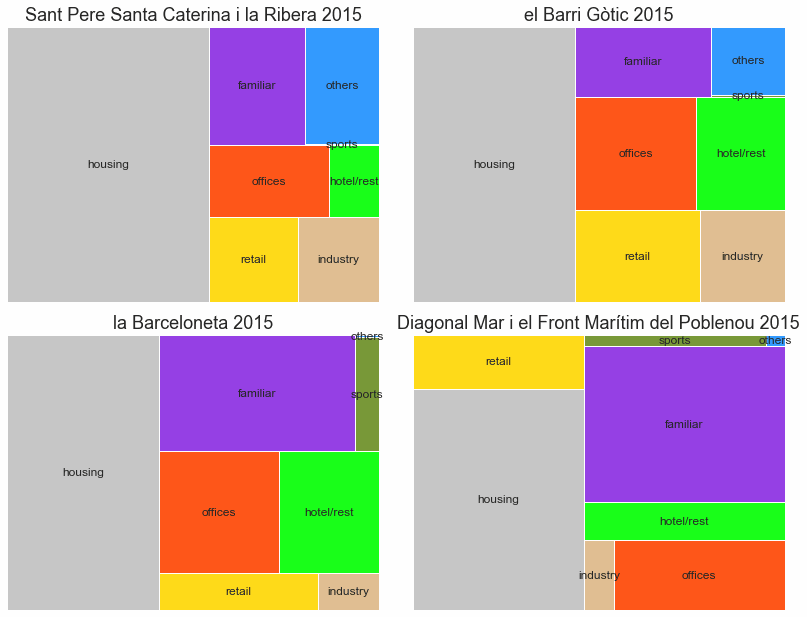

- Industrial neighbourhoods: Here we selected four typical Industrial areas from Inner-City (first column) and  Outter-City (second column)

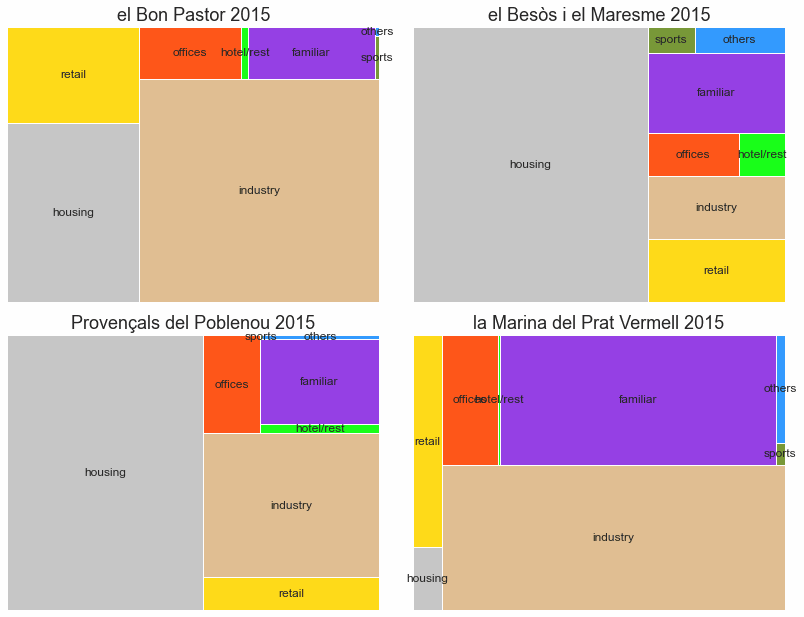

- Posh neighbourhoods: This contains four selected areas notorious for their wealth. Interestingly, regarding the structure of their distribution we note that:
    1. Is similar to some degree with some mid-class areas, if we don't take into consideration the housing area, wich is usually smaller in the "posh" areas. 
    2. They barely change their distribution over the years.

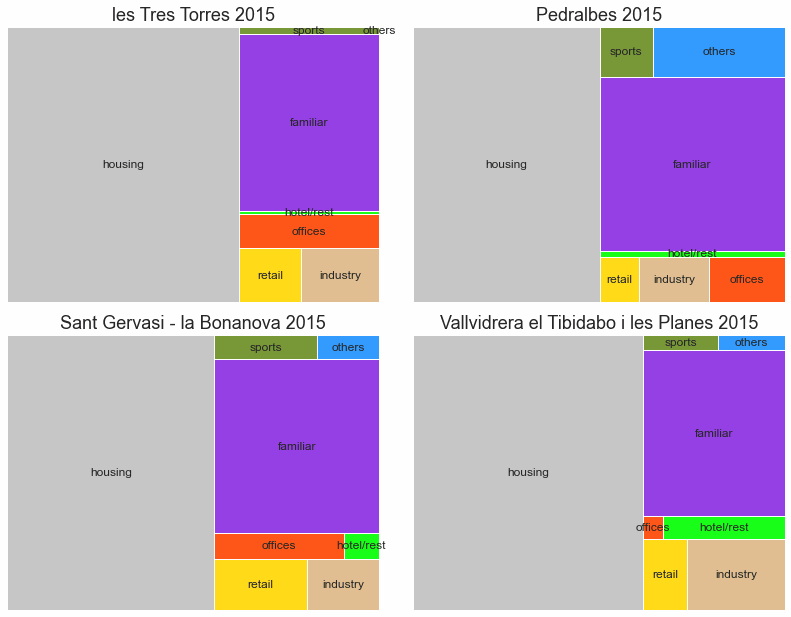

- "not-so-interesting" neighbourhoods: In this case we selected four neighbourhoods far away from the center with no particular atractions. 

Most of them were built as accomodation for workers at their time, either because they came relocated from shanty town or for a second relocation of the original relocation buildings because of their aluminosis affected condition.

Thruth be told, Barcelona had 2 Universal Expositions (1899 & 1929) and "post-civil-war" migrations (mostly in the 1950's) that attracted an unusual number of workers from the rural zones from  all over the country. Those workers that couldn't afford a home had to live somewhere and somehow, so within due time a map of shanty-town was conformed in the "less-appreciated" zones like the hills (e.g. "el Carmel", "Montjuïc"), train crossroads (e.g. "la Perona", "Baró de Viver"), industrial zones like some of the ones we saw before (e.g. "Can Tunis") or even the beach itself (e.g. "el Somorrostro").

Below there's the map of shanty-town in the 1940's <sup>[x]</sup>

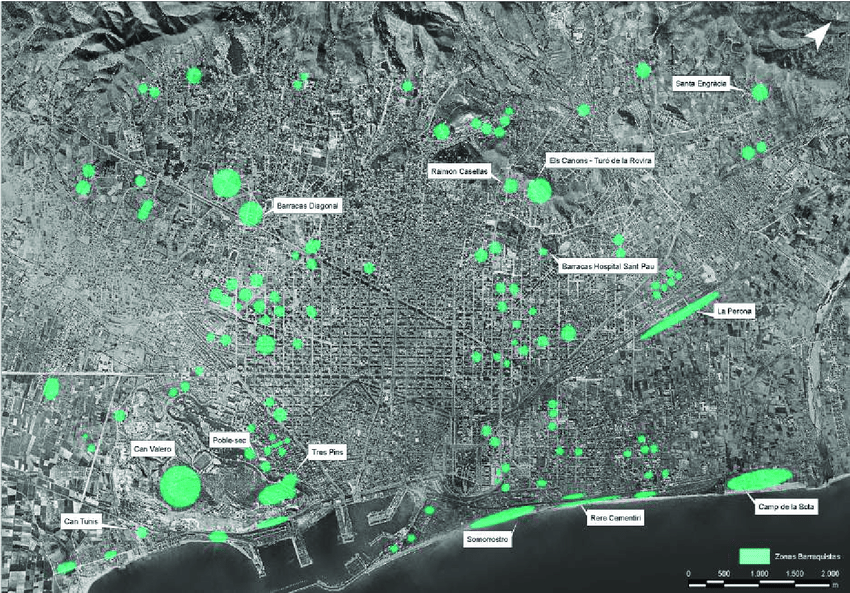

Some of those workers who had their conditions improved, usually left for a flat in the inmediations or other areas of Barcelona (a notable part of them opted for cheaper neighbouring cities like 'Santa Coloma' and 'Hospitalet', each at every side of Barcelona, forging strong "spanish-speaking"communities) but at some points in the history the authorities have had to construct houses somewhere to relocate those people and provide them a propper household, these below are just 4 of these areas.<sup>[x]</sup>

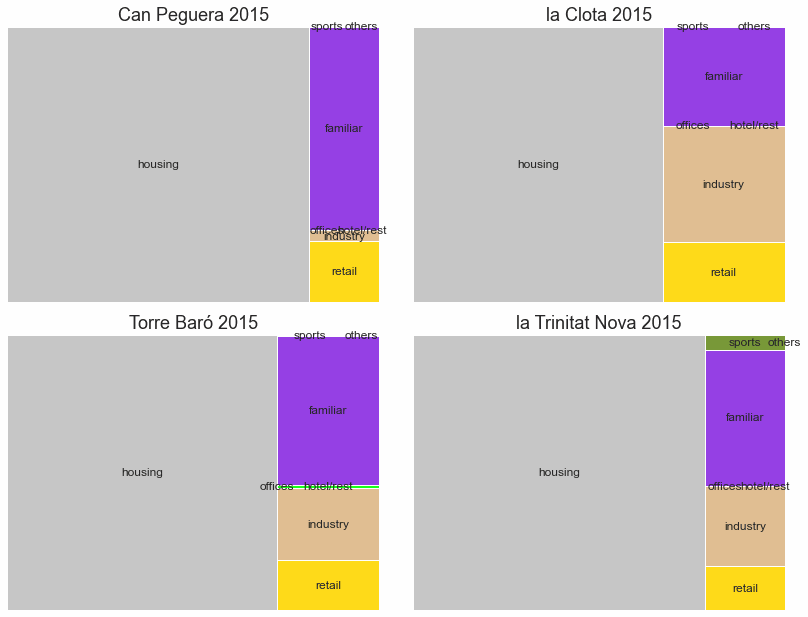

These are just a few patterns of distribution amongst others, but the idea here is that this blueprints of area distributions could be explanatory for some of the other features in the study, as suggested in most of the sources used.  


## Correlation Matrix
___

As we are going to check correlated variables, we can already discard all the variables we created, except when the variable created was a combination of two.

However, the point is to get safely to the optimal minimum number of variables since our dataset is pretty compact and a ratio rows/features of +50/1 is recommended as a rule of thumb to avoid overfitting.

In [27]:
# check features
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 365 entries, 0 to 364
Data columns (total 50 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   year                               365 non-null    int64  
 1   neighbourhood                      365 non-null    object 
 2   population                         365 non-null    float64
 3   % spaniards                        365 non-null    float64
 4   % strangers                        365 non-null    float64
 5   % w/ higher education              365 non-null    float64
 6   unemployed                         365 non-null    float64
 7   total_surface(m2)                  365 non-null    int64  
 8   housing(m2)                        365 non-null    int64  
 9   parking(m2)                        365 non-null    int64  
 10  commerce(m2)                       365 non-null    int64  
 11  industry(m2)                       365 non-null    int64  

In [28]:
# clean columns
df.drop(df.iloc[:,7:20],axis=1, inplace=True)
df.drop(df.iloc[:, 22:29], axis = 1, inplace=True)
df.drop(columns=['% spaniards', 'avg_housing(m2)', 'new_contracts_1000_hab', 
                 'expired_contracts_1000_hab','binary_rent_growth_1000_hab' ], axis = 1, inplace=True)


In [31]:
# get correlation matrixes and animate them
for year in range(2015,2020,1):
    # select rows
    df_aux = df.loc[df['year']==year]
    # get correlation matrix
    df_corr = df_aux.corr()

    # set style and plot:
    fig, ax = plt.subplots(figsize=(16,16))
    ax = sb.heatmap(data = df_corr,
                    square = True,
                    annot = True,
                    cmap = 'bwr',
                    vmin = -1,
                    center=0,
                    vmax = 1,
                    linewidths=1.5,
                    ax=ax, 
                    annot_kws={"size":11}, fmt='.2f')

    plt.title(('Correlation Matrix '+ str(year)), fontsize=20, y=1.02)
    plt.savefig(r'C:\\Users\\motxi\\Documents\\Data_Science_IT_Academy\\PROJECTE\\images\\correlations\\correlation' + str(year) + '.png',
                bbox_inches="tight")
    
    plt.close()
    
    
    # get rankings
    #c = df_corr.abs().unstack()
    #print('TOP30 most correlated features of ', year, ':\n')
    #ranking = c.sort_values(kind='quicksort', ascending=False).drop_duplicates().where(lambda x: (x<1) & (x>-1)).dropna()
    #print(ranking[:31])

    
# get all images together  
# filepaths
fp_in = r'C:\\Users\\motxi\\Documents\\Data_Science_IT_Academy\\PROJECTE\\images\\correlations/*.png'
fp_out = r'C:\\Users\\motxi\\Documents\\Data_Science_IT_Academy\\PROJECTE\\images\\corr_matrix.gif'

imgs = (Image.open(f) for f in sorted(glob.glob(fp_in)))
img = next(imgs)
img.save(fp=fp_out, format='GIF', append_images=imgs, save_all=True, duration=2500, loop=0)
        

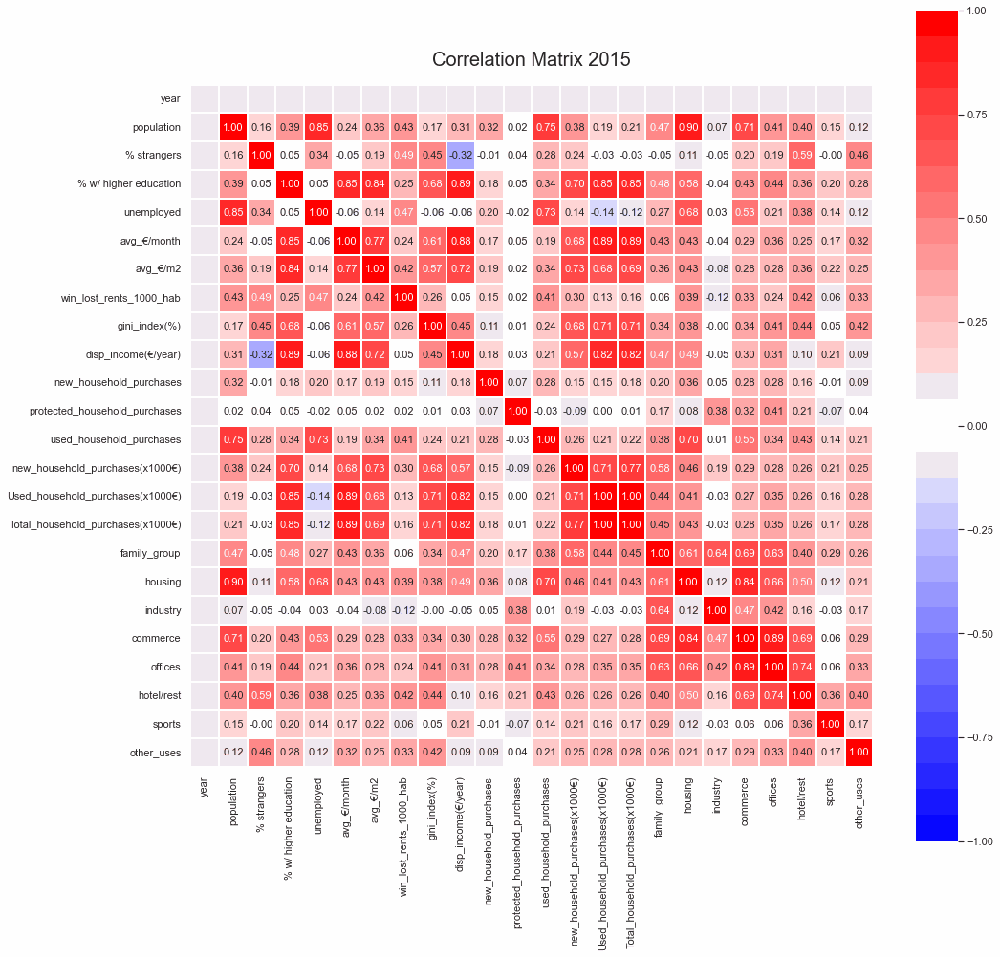

Now that we know the top correlated pairs for each year, according to the data we can see that:
- Price of Used households is +95% correlated with the Total Price of households, meaning the great majority of purchases account for households older than five years. In any case we can safely drop column 'Used_household_purchases(x1000€)'.


- Higher tuition levels are indeed $\approx$80% correlated with higher disposable incomes. Higher income professions (should) have greater requirements in terms of academic background (MD's, PhD's,...). This in turn are related to the wealthier side of price-related features like average price per month or household purchases given their high purchasing power.


- Area dedicated to Industries and Public Household Sells are two of the most independent features presenting almost no correlation with the other variables with the exception of 2019 when officces had growth too.

- As a curiosity, '% strangers' and 'disp_income(€/year)' show always the same negative correlation (-0.32%). This means the wealthier the area the less touristic, wich makes sense when thinking about economic barriers seeing how areas are distributed, with a high percent of areas from dowtown and it's surroundings dedicated to tourism.

# create smaller df with only years we want to show
df_aux = df.loc[(df['year']==2015) | (df['year']==2019)]

for hood_name in df_aux['neighbourhood'].unique():    
    # select slices to use as data for inner pie
    sizes_inner = df_aux.loc[(df['year']==2015)&(df['neighbourhood']==hood_name),
                ['housing(m2)','comerce(m2)','industry(m2)',
                'offices(m2)','hostelry(m2)','family_group',
                 'other_uses(m2)']].values.flatten().tolist()
    
    sizes_outer = df_aux.loc[(df['year']==2019)&(df['neighbourhood']==hood_name),
                ['housing(m2)','comerce(m2)','industry(m2)',
                'offices(m2)','hostelry(m2)','family_group',
                 'other_uses(m2)']].values.flatten().tolist()
    
    # write labels
    labels = ['housing','retail','industry','offices','hostelry','familiar', 'other']
    colors = ['#FFB600', '#09A0DA', '#8464a0', '#FFDA7E', '#30B7EA', '#C8A2C9', '#D6A7DF']


    # 2019
    outside_donut = plt.pie(sizes_outer, labels=labels,
                            colors=colors,
                            startangle=45, frame=True,
                            autopct='%.1f%%',
                            pctdistance =0.85)
    # 2015
    inside_donut = plt.pie(sizes_inner,
                           colors=colors,
                           radius=0.7,
                           startangle=45, 
                           #labeldistance=0.75,
                           autopct='%.1f%%',
                           pctdistance =0.40)

    centre_circle = plt.Circle((0, 0), 0.4, color='white', linewidth=0)
    fig = plt.gcf()
    fig.gca().add_artist(centre_circle)
    plt.title(hood_name)
    plt.axis('equal')
    plt.tight_layout()
    plt.show()
    plt.close()  
    
    

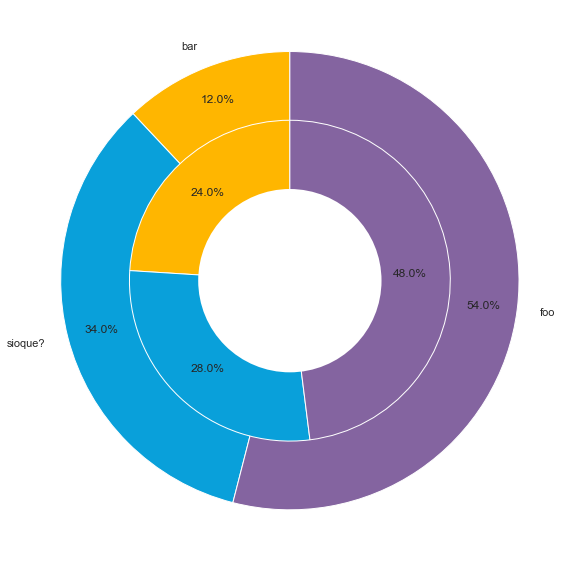

In [55]:
# mostra de grafic
df_=pd.DataFrame({'x':['bar','sioque?','foo'],'y':[12, 34, 54]})
plt.figure(figsize=(8, 8)) # change the size of a figure
labels = df_['x']
sizes = df_['y'] #els valors dels groups van aqui
colors = ['#FFB600', '#09A0DA', '#8464a0']

sizes_subgroup = [24, 28, 48] #els valors dels groups van aqui
colors_subgroup = ['#FFB600', '#09A0DA', '#8464a0']
 
# 2019
outside_donut = plt.pie(sizes, labels=labels,
                        colors=colors,
                        startangle=90, frame=True,
                        autopct='%.1f%%',
                        pctdistance =0.85)
# 2015
inside_donut = plt.pie(sizes_subgroup,
                       colors=colors_subgroup,
                       radius=0.7,
                       startangle=90, 
                       #labeldistance=0.75,
                       autopct='%.1f%%',
                       pctdistance =0.75)

centre_circle = plt.Circle((0, 0), 0.4, color='white', linewidth=0)
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
 
plt.axis('equal')
plt.tight_layout()
plt.show()
plt.close()

# 2. NOW TO AIRBNB 
## Assuming that airbnb has almost a complete target niche (short term flat rents in a foreign city) it's really tempting too choo-choo-chooose it as an indicator of tourist undercover economy as most of them dont have license. EDA needed for further conclusions



In [ ]:
stop!
df = pd.read_csv(r"C:\\Users\\motxi\\Documents\\Data_Science_IT_Academy\\PROJECTE\\data\\airbnb_dataset.csv")
df.info()
df

___
- 3r ultimes tesis i enfoques

- 6è kaizen again and again

___

- 7º Results

Falta  tasa de natalitat!!!! aixi no es pot saber si un aument de poblacio es per naixements o per altres causes

- 8º Acknoledgements & Lessons Learned

1. Not all data is made equal: Changes in format, calculus and specially typos, can make this an unnecessary journey.

2. The official may not be official: Errors in Administrations happen just so we spend precious hours re-Checking all code when you can go to the source instead and realise it's their fault.

3. When looking for resources, be a re.findall not a re.match: It feels so frustrating to found better datasets and much more complete when looking for data to be imputated. 

___



- 8º Documentation


[1] Miriam Zuk, Ariel H. Bierbaum, Karen Chapple, Karolina Gorska, Anastasia, Loukaitou-Sideris, Paul Ong, and Trevor Thomas. 2015. ***Gentrification,Displacement, and the Role of Public Investment: A Literature Review.*** https://doi.org/10.1177/0885412217716439

[2] Miquel Angel Garcia-López, Jordi Jofre-Monseny, R.Martínez-Mazza, M.Segú. 2020.
***Do short-term rental platforms affect housing markets? Evidence from Airbnb in Barcelona***. https://doi.org/10.1016/j.jue.2020.103278

[3] Mychal Cohen, Kathryn L.S. Pettit. 2019. ***Guide to measuring neighborhood change to understand and prevent displacement***. https://www.urban.org/sites/default/files/publication/100135/guide_to_measuring_neighborhood_change_to_understand_and_prevent_displacement.pdf
 
 
[3] Inside AirBnB Project Web. ***Historical data from Airbnb***. http://insideairbnb.com/barcelona

[3] Inside AirBnB Project Web. ***Data Dictionary for Airbnb listings databases***. https://docs.google.com/spreadsheets/d/1iWCNJcSutYqpULSQHlNyGInUvHg2BoUGoNRIGa6Szc4/edit#gid=1322284596

[4] Opendatasoft. ***Historical data from Airbnb***. https://public.opendatasoft.com/explore/dataset/airbnb-listings/information/?disjunctive.host_verifications&disjunctive.amenities&disjunctive.features&refine.country=Spain&refine.city=Barcelona

[6] Ajuntament de Barcelona. ***Historical Census total area (m<sup>2</sup>) distributed by types of uses and Neighborhoods***. https://ajuntament.barcelona.cat/estadistica/castella/Estadistiques_per_temes/Habitatge_i_mercat_immobiliari/Edificis_i_habitatges/Dades_cadastrals/locals/sup/

[7] Ajuntament de Barcelona. ***Historical average rent prices 2014-2022 (€ / m<sup>2</sup> and € / month) distributed by Neighborhoods***. https://ajuntament.barcelona.cat/estadistica/catala/Estadistiques_per_territori/Barris/Habitatge_i_mercat_immobiliari/Mercat_immobiliari/Habitatges_lloguer/index.htm

[8] Ajuntament de Barcelona. ***Historical average rent prices 2007-2011 (€ / m<sup>2</sup> and € / month) distributed by Neighborhoods***. https://ajuntament.barcelona.cat/estadistica/catala/Estadistiques_per_temes/Habitatge_i_mercat_immobiliari/Mercat_immobiliari/Taules_metodologia_anterior/h2mallo/index.htm

index gini

renda disponible

adreça padro oficial https://ajuntament.barcelona.cat/estadistica/catala/Estadistiques_per_territori/Barris/Poblacio_i_demografia/Poblacio/Padro_municipal_habitants/index.htm


[x] CCMA.TV3 Documentary ***Barraques, l'altra ciutat***. https://www.ccma.cat/tv3/alacarta/30-minuts/barraques-laltra-ciutat/video/5372671/

[x] Gallego-Vila, Laia . 2018. ***El barraquismo en la ciudad de Barcelona durante el Franquismo. Primeras aproximaciones a una domesticidad desde los márgenes***
